## Import necessary packages

In [30]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import pandas as pd
import numpy as np
import seaborn as sns

import nibabel as nib
from nibabel.processing import resample_from_to
from nilearn import datasets, image, plotting
from nilearn.plotting import view_img, plot_glass_brain, plot_anat, plot_epi
from dipy.align.transforms import AffineTransform2D, AffineTransform3D
from dipy.align.imaffine import AffineRegistration
from nipype.algorithms.confounds import TSNR
from nipype.interfaces import freesurfer
from nltools.data import Brain_Data
from skimage.feature import canny
from skimage.transform import resize
import templateflow.api as tflow

import os
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## Data overview

In [31]:
img_bold = nib.load("../AA_041/AA_041_6_MB_Resting.nii.gz")
type(img_bold)

nibabel.nifti1.Nifti1Image

In [32]:
print(img_bold.shape)

(116, 116, 45)


In [33]:
data_bold = img_bold.get_fdata()
type(data_bold)

numpy.ndarray

In [34]:
print(data_bold.dtype)

float64


In [35]:
header_bold = img_bold.header
print(header_bold)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 57
dim             : [  3 116 116  45   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.         1.7931035  1.7931035  2.79       0.664      0.
  0.         0.       ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : sequential increasing
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'TE=30;Time=160208.867;phase=1'
aux_file        : b'Single-band reference'
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0009629291
quatern_c       : -0.9986472
quat

In [36]:
img_t1 = nib.load("../AA_041/AA_041_2_MPRAGE_GRAPPA2.nii.gz")
data_t1 = img_t1.get_fdata()

In [37]:
print(img_t1.shape)

(176, 240, 256)


In [38]:
header_t1 = img_t1.header
print(header_t1)

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 54
dim             : [  3 176 240 256   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [1.        1.1999999 1.0546875 1.0546875 2.3       0.        0.
 0.       ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : b'TE=3;Time=154508.515;phase=1'
aux_file        : b''
qform_code      : scanner
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 0.013089597
quatern_d       : 0.0
qoffset_x       : -108.47097
qoffs

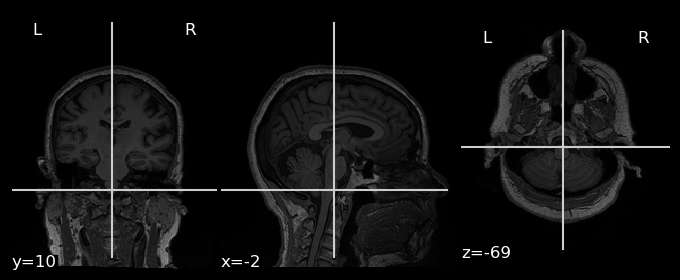

In [39]:
plot_anat(img_t1)

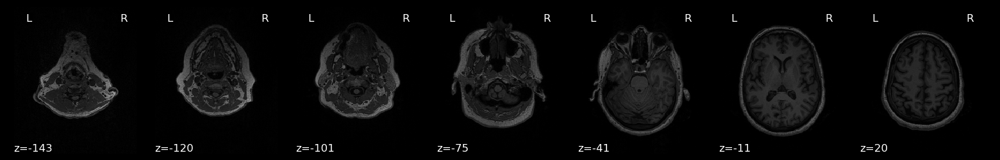

In [40]:
plot_anat(img_t1, draw_cross=False, display_mode='z')


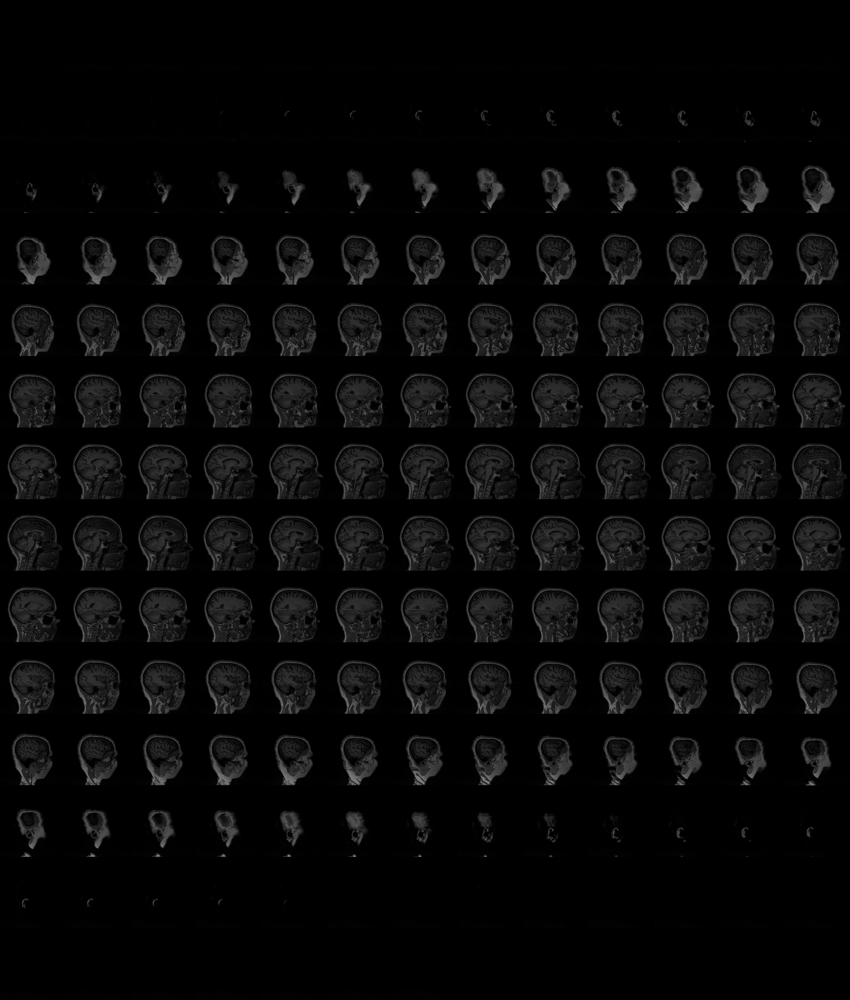
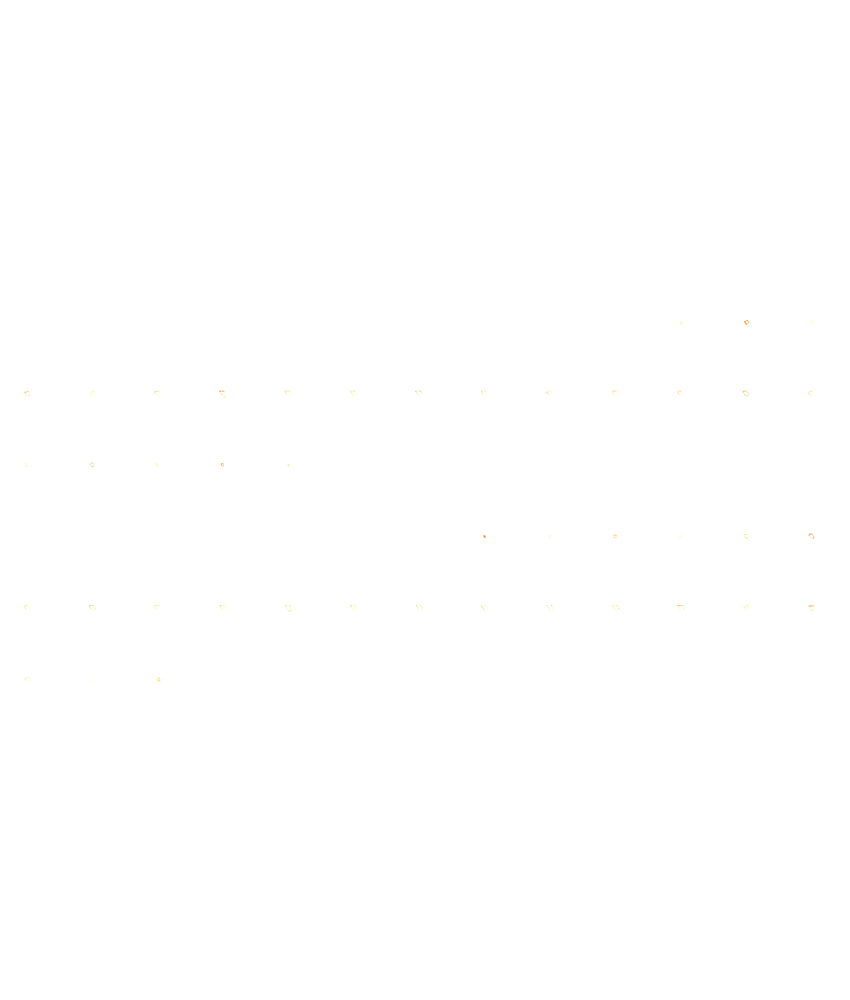

In [41]:
amygdala_mask = Brain_Data('https://neurovault.org/media/images/1290/FSL_BAmyg_thr0.nii.gz').to_nifti()
view_img(amygdala_mask, img_t1)

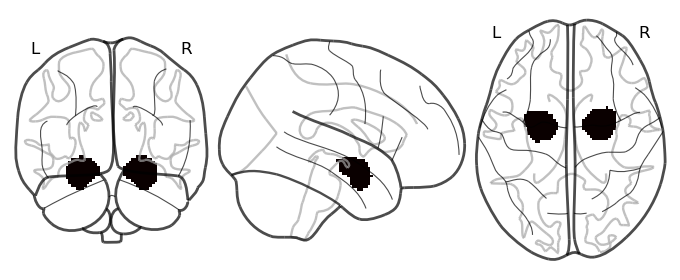

In [42]:
plot_glass_brain(amygdala_mask)

## Coordinate frames

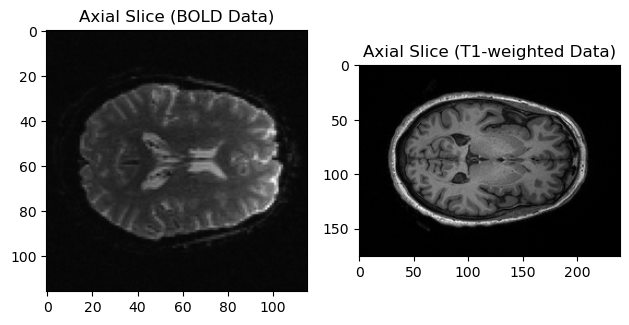

In [43]:
bold_slice = data_bold[:, :, data_bold.shape[2] // 2]
t1_slice = data_t1[:, :, data_t1.shape[2] // 2]

fig, ax = plt.subplots(1, 2)
ax[0].imshow(bold_slice, cmap='gray')
ax[0].set_title('Axial Slice (BOLD Data)')
ax[1].imshow(t1_slice, cmap='gray')
ax[1].set_title('Axial Slice (T1-weighted Data)')
plt.tight_layout()
plt.show()

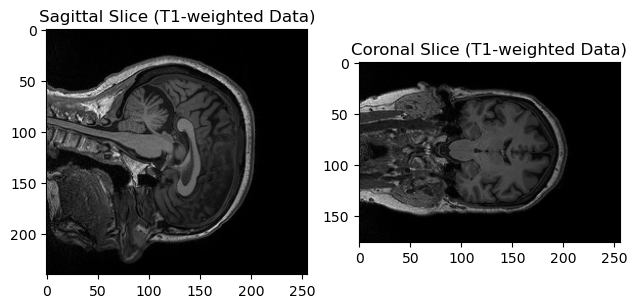

In [44]:
sagittal_slice_t1 = data_t1[data_t1.shape[0] // 2, :, :]
coronal_slice_t1 = data_t1[:, data_t1.shape[1] // 2, :]

fig, ax = plt.subplots(1, 2)
ax[0].imshow(sagittal_slice_t1, cmap='gray')
ax[0].set_title('Sagittal Slice (T1-weighted Data)')
ax[1].imshow(coronal_slice_t1, cmap='gray')
ax[1].set_title('Coronal Slice (T1-weighted Data)')
plt.tight_layout()
plt.show()

## Image segmentation

### Intensity-based segmentation

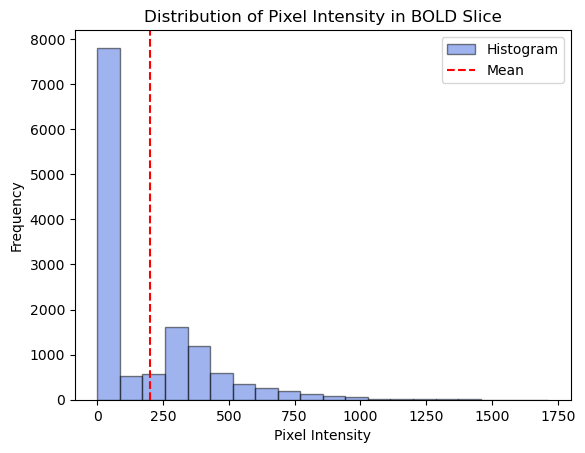

In [45]:
mean = np.mean(bold_slice)
fig, ax = plt.subplots()
ax.hist(bold_slice.flat, bins=20, alpha=0.5, color='royalblue', edgecolor='black', label='Histogram')
ax.axvline(mean, linestyle='dashed', color='red', label='Mean')
ax.set_xlabel('Pixel Intensity')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Pixel Intensity in BOLD Slice')
ax.legend()
plt.show()

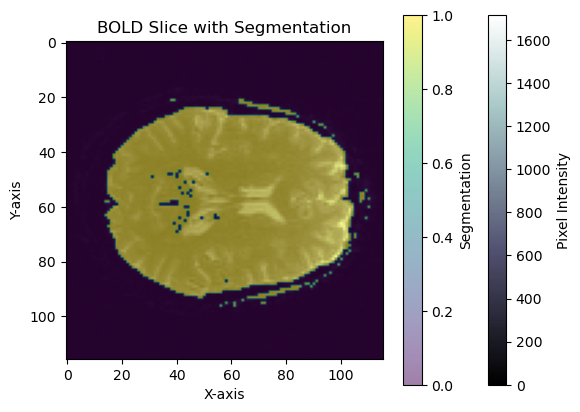

In [46]:
segmentation = np.zeros_like(bold_slice)
segmentation[bold_slice > mean] = 1
fig, ax = plt.subplots()
im1 = ax.imshow(bold_slice, cmap="bone")
im2 = ax.imshow(segmentation, alpha=0.5)
cbar1 = plt.colorbar(im1, ax=ax, label="Pixel Intensity")
cbar2 = plt.colorbar(im2, ax=ax, label="Segmentation")
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_title("BOLD Slice with Segmentation")
plt.show()

**Otsu's method**

In [47]:
min_intraclass_variance = np.inf
for candidate in np.unique(bold_slice):
    foreground = bold_slice[bold_slice < candidate]
    background = bold_slice[bold_slice >= candidate]
    if len(foreground) and len(background):
        foreground_variance = np.var(foreground) * len(foreground)
        background_variance =  np.var(background) * len(background)
        intraclass_variance = foreground_variance + background_variance
        if intraclass_variance < min_intraclass_variance:
            min_intraclass_variance = intraclass_variance
            threshold = candidate

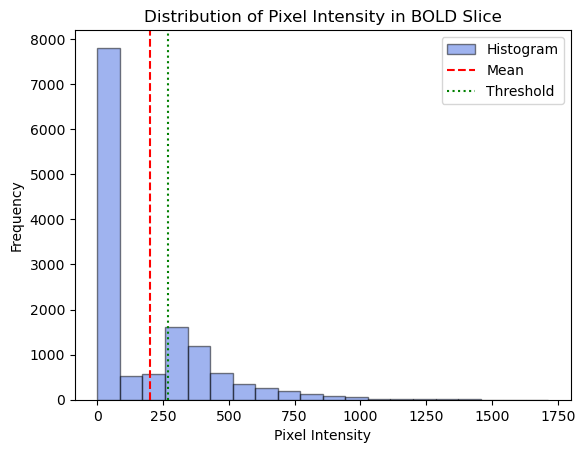

In [48]:
mean = np.mean(bold_slice)
fig, ax = plt.subplots()
ax.hist(bold_slice.flat, bins=20, alpha=0.5, color='royalblue', edgecolor='black', label='Histogram')
ax.axvline(mean, linestyle='dashed', color='red', label='Mean')
ax.axvline(threshold, linestyle='dotted', color='green', label='Threshold')
ax.set_xlabel('Pixel Intensity')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Pixel Intensity in BOLD Slice')
ax.legend()
plt.show()

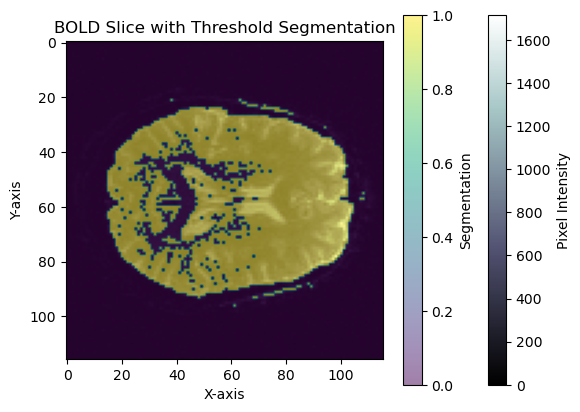

In [49]:
segmentation = np.zeros_like(bold_slice)
segmentation[bold_slice > threshold] = 1
fig, ax = plt.subplots()
im1 = ax.imshow(bold_slice, cmap="bone")
im2 = ax.imshow(segmentation, alpha=0.5)
cbar1 = plt.colorbar(im1, ax=ax, label="Pixel Intensity")
cbar2 = plt.colorbar(im2, ax=ax, label="Segmentation")
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_title("BOLD Slice with Threshold Segmentation")
plt.show()

### Edge-based segmentation

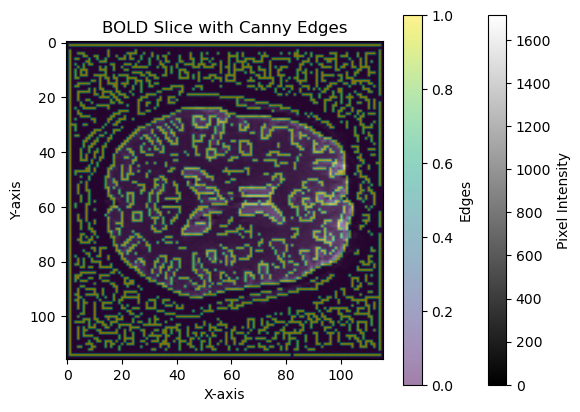

In [50]:
edges = canny(bold_slice)

fig, ax = plt.subplots()
im1 = ax.imshow(bold_slice, cmap="gray")
im2 = ax.imshow(edges, alpha=0.5)

cbar1 = plt.colorbar(im1, ax=ax, label="Pixel Intensity")
cbar2 = plt.colorbar(im2, ax=ax, label="Edges")

ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_title("BOLD Slice with Canny Edges")

plt.show()

## Image registration

In [51]:
mni_img = nib.load(tflow.get('MNI152NLin2009cAsym', resolution=1, suffix="T1w", desc=None))
mni_data = mni_img.get_fdata()

In [52]:
img_t1_resampled = resample_from_to(img_t1, (mni_img.shape, mni_img.affine))
img_t1_resamp_data = np.asanyarray(img_t1_resampled.dataobj)

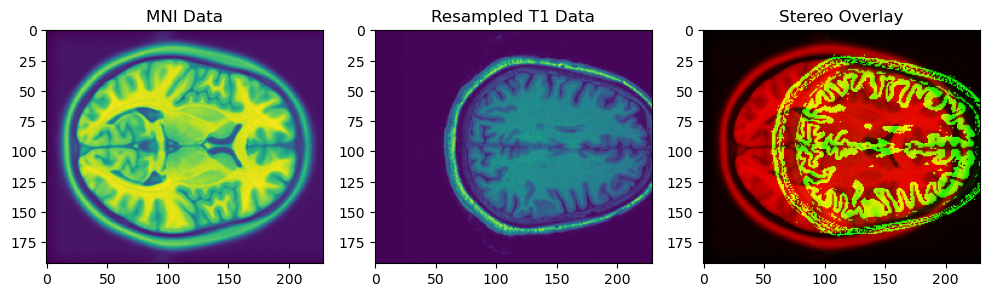

In [53]:
fig, axes = plt.subplots(1, 3, figsize=(10, 4))
ax = axes.ravel()

ax[0].imshow(mni_data[:, :, 85])
ax[0].set_title('MNI Data')

ax[1].imshow(img_t1_resamp_data[:, :, 85])
ax[1].set_title('Resampled T1 Data')

stereo = np.zeros((193, 229, 3), dtype=np.uint8)
stereo[..., 0] = 255 * mni_data[:, :, 85]/np.max(mni_data)
stereo[..., 1] = 255 * img_t1_resamp_data[:, :, 85]/np.max(img_t1_resamp_data)
ax[2].imshow(stereo)
ax[2].set_title('Stereo Overlay')

fig.tight_layout()

In [25]:
affreg = AffineRegistration()
affine3d = affreg.optimize(mni_data, img_t1_resamp_data, AffineTransform3D(), params0=None)
t1_xform = affine3d.transform(img_t1_resamp_data)

Optimizing level 2 [max iter: 10000]
Optimizing level 1 [max iter: 1000]
Optimizing level 0 [max iter: 100]


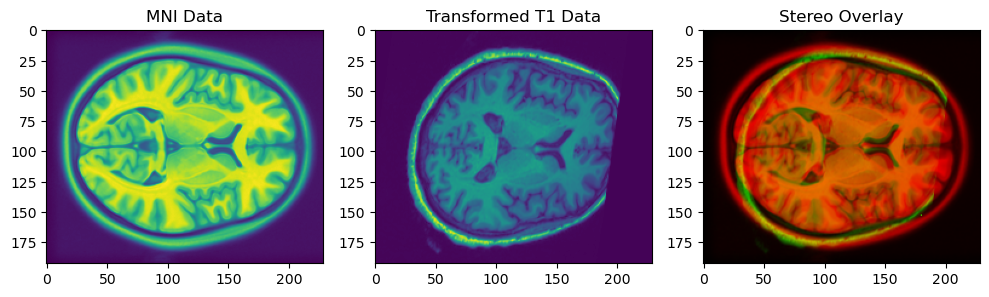

In [26]:
fig, axes = plt.subplots(1, 3, figsize=(10, 4))
ax = axes.ravel()

ax[0].imshow(mni_data[:, :, 85]/np.max(mni_data))
ax[0].set_title('MNI Data')

ax[1].imshow(t1_xform[:, :, 85]/np.max(t1_xform))
ax[1].set_title('Transformed T1 Data')

stereo = np.zeros((193, 229, 3), dtype=np.uint8)
stereo[..., 0] = 255 * mni_data[:, :, 85]/np.max(mni_data)
stereo[..., 1] = 255 * t1_xform[:, :, 85]/np.max(t1_xform)
ax[2].imshow(stereo)
ax[2].set_title('Stereo Overlay')

fig.tight_layout()

## Analyzing MRI data quality using tSNR

In [27]:
tsnr = TSNR()
tsnr.inputs.in_file = "../AA_041/AA_041_6_MB_Resting.nii.gz"
res = tsnr.run()

In [28]:
tsnr_img = nib.load("../tsnr.nii.gz") # contains results of the computation
tsnr_data = tsnr_img.get_fdata()
tsnr_data.shape

(116, 116, 45)

## Hippocampal-subfield segmentation

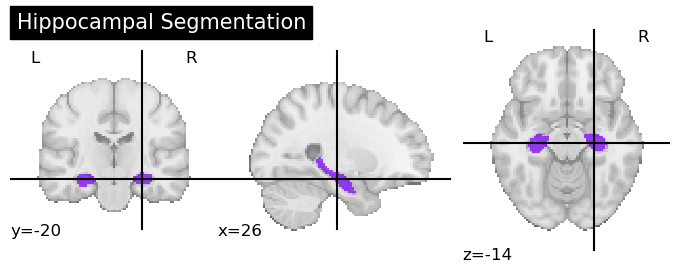

In [29]:
# Preprocessing
# Skull stripping
brain_mask = image.math_img('img > 0', img=img_t1)
t1_brain = image.math_img('img1 * img2', img1=img_t1, img2=brain_mask)

# Intensity normalization
t1_norm = image.mean_img(t1_brain)

# Registration to MNI space
mni_template = datasets.load_mni152_template()
registration = image.resample_to_img(t1_norm, mni_template)
registered_t1 = image.mean_img(registration)

# Atlas-based Segmentation
atlas = datasets.fetch_atlas_harvard_oxford('sub-maxprob-thr25-2mm')

# Create a new NIfTI image using the atlas data and the header from the original image
atlas_data = atlas.maps.get_fdata()
atlas_affine = atlas.maps.affine
atlas_img = image.new_img_like(img_t1, atlas_data, affine=atlas_affine)

# Extract hippocampal fields
hippocampus_labels = [9, 19]  # Field labels for hippocampus
hippocampus_mask = image.math_img('img == {}'.format(hippocampus_labels[0]), img=atlas_img)
for label in hippocampus_labels[1:]:
    hippocampus_mask = image.math_img('np.logical_or(hippocampus_mask, img == {})'.format(label),
                                      img=atlas_img,
                                      hippocampus_mask=hippocampus_mask)

# Plot the segmentation results
plotting.plot_roi(hippocampus_mask, title='Hippocampal Segmentation', cmap='rainbow')

# Save the segmentation masks as NIfTI files
hippocampus_mask_file = '../hippocampus_mask.nii.gz'
hippocampus_mask.to_filename(hippocampus_mask_file)

In [30]:
# Print the labels for all regions
for label, region in enumerate(atlas.labels):
    print(f"Label: {label}, Region: {region}")

Label: 0, Region: Background
Label: 1, Region: Left Cerebral White Matter
Label: 2, Region: Left Cerebral Cortex 
Label: 3, Region: Left Lateral Ventrical
Label: 4, Region: Left Thalamus
Label: 5, Region: Left Caudate
Label: 6, Region: Left Putamen
Label: 7, Region: Left Pallidum
Label: 8, Region: Brain-Stem
Label: 9, Region: Left Hippocampus
Label: 10, Region: Left Amygdala
Label: 11, Region: Left Accumbens
Label: 12, Region: Right Cerebral White Matter
Label: 13, Region: Right Cerebral Cortex 
Label: 14, Region: Right Lateral Ventricle
Label: 15, Region: Right Thalamus
Label: 16, Region: Right Caudate
Label: 17, Region: Right Putamen
Label: 18, Region: Right Pallidum
Label: 19, Region: Right Hippocampus
Label: 20, Region: Right Amygdala
Label: 21, Region: Right Accumbens


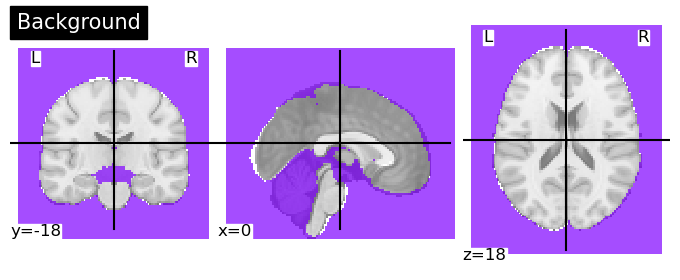

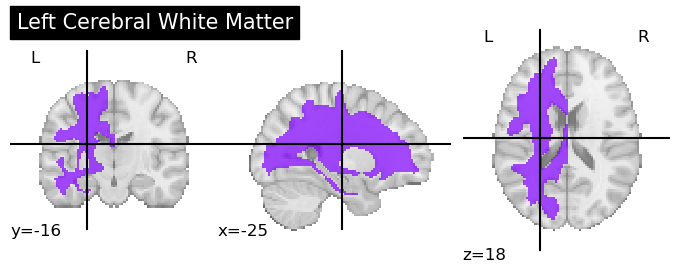

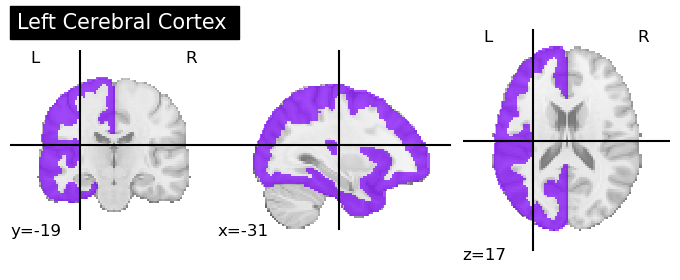

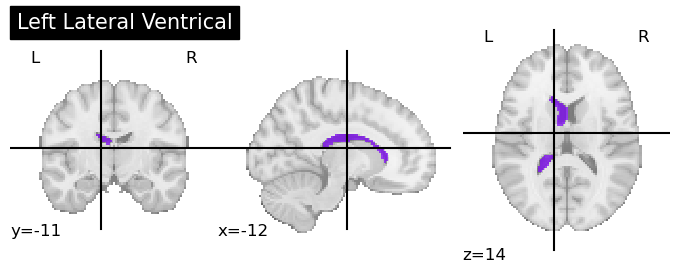

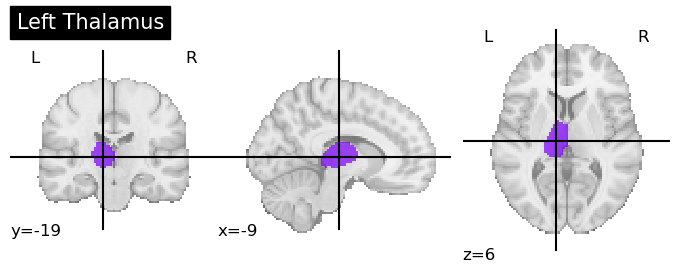

...

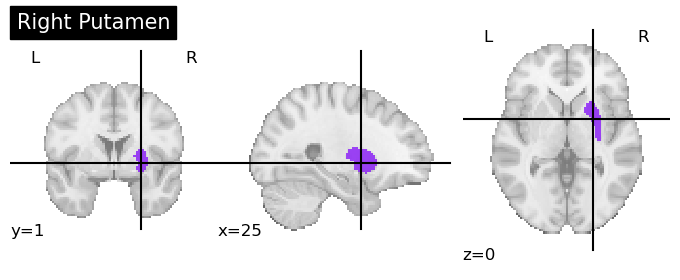

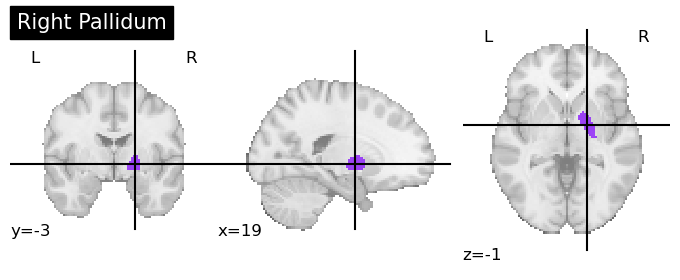

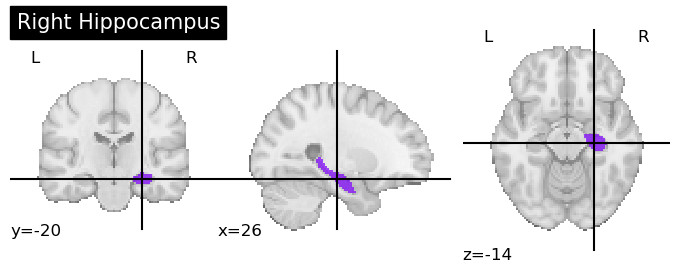

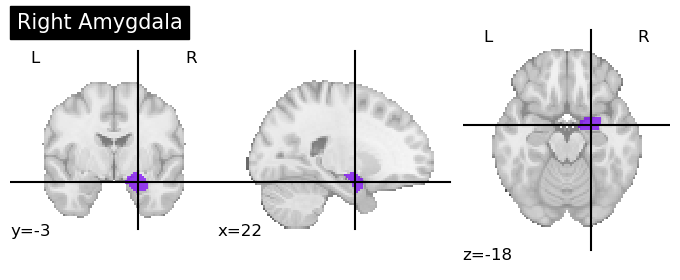

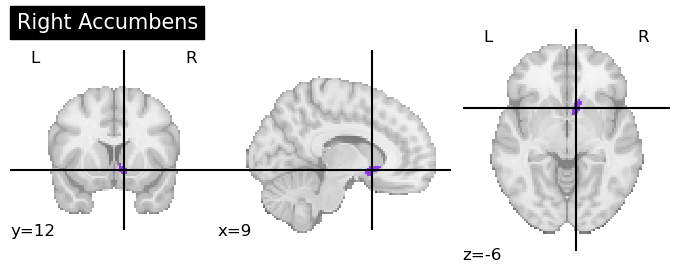

In [31]:
# Preprocessing
# Skull stripping
brain_mask = image.math_img('img > 0', img=img_t1)
t1_brain = image.math_img('img1 * img2', img1=img_t1, img2=brain_mask)

# Intensity normalization
t1_norm = image.mean_img(t1_brain)

# Registration to MNI space
mni_template = datasets.load_mni152_template()
registration = image.resample_to_img(t1_norm, mni_template)
registered_t1 = image.mean_img(registration)

# Atlas-based Segmentation
# Load the atlas defining entorhinal cortex subfields
atlas = datasets.fetch_atlas_harvard_oxford('sub-maxprob-thr25-2mm')

# Create a new NIfTI image using the atlas data and the header from the original image
atlas_data = atlas.maps.get_fdata()
atlas_affine = atlas.maps.affine
atlas_img = image.new_img_like(img_t1, atlas_data, affine=atlas_affine)

# Iterate over each region and extract its mask
for label, region in enumerate(atlas.labels):
    mask = image.math_img('img == {}'.format(label), img=atlas_img)
    plotting.plot_roi(mask, title=region, cmap='rainbow', colorbar=False)
    plt.pause(1)  # Pause for 1 second between each plot

plt.show()  # Show all the plots at once

# Save the segmented labels
atlas_img.to_filename('../segmented_labels.nii.gz')

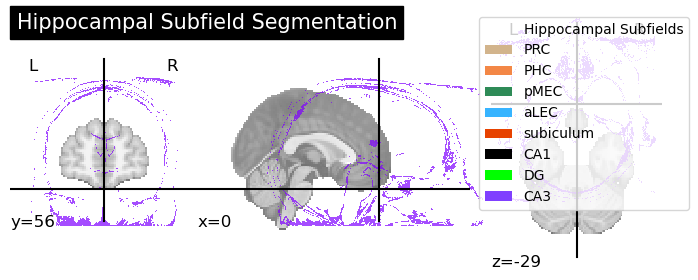

In [32]:
# Preprocessing
# Skull stripping
brain_mask = image.math_img('img > 0', img=img_t1)
t1_brain = image.math_img('img1 * img2', img1=img_t1, img2=brain_mask)

# Intensity normalization
t1_norm = image.mean_img(t1_brain)

# Registration to MNI space
mni_template = datasets.load_mni152_template()
registration = image.resample_to_img(t1_norm, mni_template)
registered_t1 = image.mean_img(registration)

# Load ASHS atlas template
atlas_template_path = '../ashs_atlas_upennpmc_20170810/template/template.nii.gz'
atlas_template = nib.load(atlas_template_path)

# Load snaplabels.txt to obtain label information
labels_file_path = '../ashs_atlas_upennpmc_20170810/snap/snaplabels.txt'
labels = {}
with open(labels_file_path, 'r') as file:
    for line in file:
        if line.startswith('#') or line.strip() == '':
            continue
        fields = line.split()
        index = int(fields[0])
        red = int(fields[1]) / 255.0
        green = int(fields[2]) / 255.0
        blue = int(fields[3]) / 255.0
        description = fields[4].strip('"')
        labels[(red, green, blue)] = (index, description)

# Define the hippocampal subfields of interest
subfield_labels = {
    'PRC': 10,
    'PHC': 13,
    'pMEC': 14,
    'aLEC': 11,
    'subiculum': 8,
    'CA1': 1,
    'DG': 3,
    'CA3': 4
}

# Load input image and resize it to match the atlas template size
input_data = registered_t1.get_fdata()
resized_data = resize(input_data, atlas_template.shape, order=1, mode='constant', anti_aliasing=True)

# Normalize intensities to match atlas template
resized_data = (resized_data - np.mean(resized_data)) / np.std(resized_data)

# Create an empty segmentation volume
segmentation = np.zeros_like(atlas_template.get_fdata(), dtype=np.uint8)

# Iterate through each voxel in the atlas
for i in range(atlas_template.shape[0]):
    for j in range(atlas_template.shape[1]):
        for k in range(atlas_template.shape[2]):
            voxel_color = atlas_template.get_fdata()[i, j, k] / 255.0

            # Find the closest label color within a threshold range
            min_dist = float('inf')
            closest_color = None
            for label_color in labels.keys():
                dist = np.linalg.norm(np.array(label_color) - voxel_color)
                if dist < min_dist:
                    min_dist = dist
                    closest_color = label_color

            if closest_color is not None:
                index, description = labels[closest_color]
                if index in subfield_labels.values():
                    propagated_label = resized_data[i, j, k]
                    thresholded_label = np.where(propagated_label >= np.percentile(propagated_label, 75), 1, 0)
                    segmentation[i, j, k] = index

# Plot the segmentation results
segmentation_img = nib.Nifti1Image(segmentation, affine=atlas_template.affine)
plotting.plot_roi(segmentation_img, title='Hippocampal Subfield Segmentation', cmap='rainbow')

# Create a legend for the plot
legend_elements = [Patch(facecolor='none', edgecolor='none', label='Hippocampal Subfields')]
for label, index in subfield_labels.items():
    color = tuple(np.array(list(labels.keys()))[index - 1])
    legend_elements.append(Patch(facecolor=color, edgecolor='none', label=label))

# Display the legend
plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.2, 1))

# Save the segmentation masks as NIfTI files
hippocampus_mask_file = '../hippocampus_mask.nii.gz'
segmentation_img.to_filename(hippocampus_mask_file)

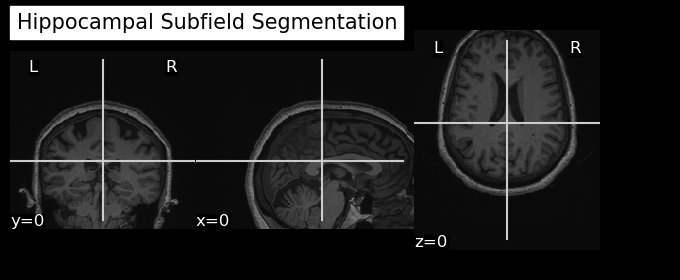

In [33]:
# Define the target subfields
target_subfields = ['PRC', 'PHC', 'pMEC', 'aLEC', 'SUB', 'CA1', 'DG']

# Create a dictionary to map subfield names to label indices
label_mapping = {
    'PRC': 12,
    'PHC': 13,
    'pMEC': 7,
    'aLEC': 9,
    'SUB': 5,
    'CA1': 1,
    'DG': 3
}

# Preprocessing
# Skull stripping
brain_mask = image.math_img('img > 0', img=img_t1)
t1_brain = image.math_img('img1 * img2', img1=img_t1, img2=brain_mask)

# Intensity normalization
t1_norm = image.mean_img(t1_brain)

# Registration to MNI space
mni_template = datasets.load_mni152_template()
registration = image.resample_to_img(t1_norm, mni_template)
registered_t1 = image.mean_img(registration)

# Atlas-based Segmentation
# Load the atlas defining hippocampal subfields
atlas_img = nib.load('../ashs_atlas_upennpmc_20170810/template/template.nii.gz')
atlas_data = atlas_img.get_fdata()
atlas_affine = atlas_img.affine

# Create a binary mask for the target subfields
subfield_mask = np.zeros_like(atlas_data)
for subfield in target_subfields:
    label_index = label_mapping[subfield]
    subfield_mask[atlas_data == label_index] = label_index

# Create a NIfTI image using the subfield mask and the affine from the registered image
subfield_img = nib.Nifti1Image(subfield_mask, registered_t1.affine)

# Overlay the subfield segmentation on the registered T1-weighted image
display = plotting.plot_anat(registered_t1, title='Hippocampal Subfield Segmentation', display_mode='ortho', cut_coords=(0, 0, 0))
display.add_overlay(subfield_img, cmap='rainbow', colorbar=True, vmin=1, vmax=len(target_subfields))

plt.show()

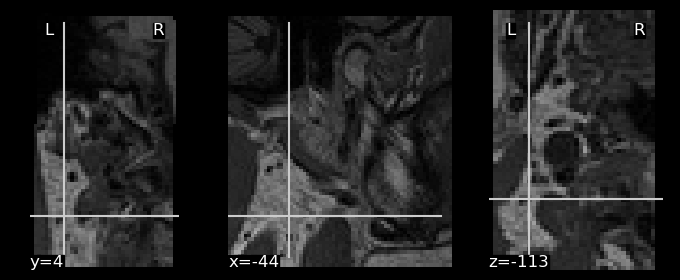

In [34]:
img_t1_segmented_left = nib.load("../AA_041/AA_041_2_MPRAGE_GRAPPA2_hippocampus_left_AffineFast_crop.nii.gz")
data_t1_segmented_left = img_t1_segmented_left.get_fdata()
plot_anat(img_t1_segmented_left)

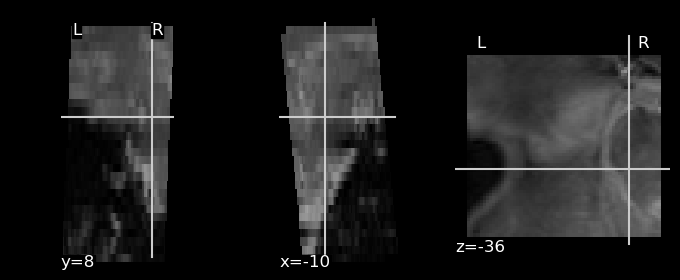

In [35]:
img_t2_segmented_left = nib.load("../AA_041/AA_041_4_AXIAL_T2_STAR_hippocampus_left_AffineFast_crop.nii.gz")
data_t2_segmented_left = img_t2_segmented_left.get_fdata()
plot_anat(img_t2_segmented_left)

In [27]:
# Set the FreeSurfer home directory
freesurfer_home = "/Applications/freesurfer/7.4.1"

# Set the FREESURFER_HOME environment variable
os.environ["FREESURFER_HOME"] = freesurfer_home

# Add the FreeSurfer binaries to the system's PATH
os.environ["PATH"] = f"{freesurfer_home}/bin:{os.environ['PATH']}"

# Specify the list of subject IDs
subject_ids = ['AA_041', 'AA_085']

# Create the output directory if it doesn't exist
output_dir = "../outputs"
os.makedirs(output_dir, exist_ok=True)

# Preprocessing and segmentation for each subject
for subject_id in subject_ids:
    # Specify the T1-weighted image for the subject
    t1_image = f"../{subject_id}/{subject_id}_2_MPRAGE_GRAPPA2.nii.gz"

    # Run recon-all for initial processing
    recon_all = freesurfer.ReconAll()
    recon_all.inputs.subjects_dir = output_dir
    recon_all.inputs.subject_id = subject_id
    recon_all.inputs.directive = "all"  # Perform initial processing
    recon_all.run()
    
    # it will give output, then make a path from atlas and freesurfer
    # make new path from atlases
    # talairach atlas
    # for structural dont use t2 weighted

    # Run hippocampal subfield segmentation
    recon_hipp = freesurfer.HippocampalSubfieldsT1()
    recon_hipp.inputs.subjects_dir = output_dir
    recon_hipp.inputs.subject_id = subject_id
    recon_hipp.inputs.hippocampal_subfields_T1 = True
    recon_hipp.run()

230716-12:32:38,673 nipype.interface INFO:
	 resume recon-all : recon-all -all -subjid AA_041 -sd ../outputs 
230716-12:32:38,675 nipype.interface INFO:
	 resume recon-all : recon-all -all -subjid AA_041 -sd ../outputs 
230716-12:32:39,410 nipype.interface INFO:
	 stdout 2023-07-16T12:32:39.410319:fs-check-version --s AA_041 --o /var/folders/9w/16vdgrh16h70kmd45bktc2f00000gn/T//tmp.ch1BUo
230716-12:32:39,560 nipype.interface INFO:
	 stdout 2023-07-16T12:32:39.560447:Sun Jul 16 12:32:39 EDT 2023
230716-12:32:39,571 nipype.interface INFO:
	 stdout 2023-07-16T12:32:39.571120:
230716-12:32:39,581 nipype.interface INFO:
	 stdout 2023-07-16T12:32:39.581220:setenv SUBJECTS_DIR /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/outputs
230716-12:32:39,593 nipype.interface INFO:
	 stdout 2023-07-16T12:32:39.593774:cd /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/NeuroDataAlchemy
230716-12:32:39,604 nipype.interface INFO:
	 stdout 2023-07-16T12:32:39.604666:/Applications/freesurfe

AttributeError: module 'nipype.interfaces.freesurfer' has no attribute 'HippocampalSubfieldsT1'

In [6]:
import os
import numpy as np
import nibabel as nib
import subprocess
import matplotlib.pyplot as plt

# Specify the list of subject IDs
subject_ids = ['AA_041', 'AA_085']

# Create the output directory if it doesn't exist
output_dir = "../outputs"
os.makedirs(output_dir, exist_ok=True)

# Preprocessing and segmentation for each subject
for subject_id in subject_ids:
    # Specify the T1-weighted image for the subject
    t1_image = f"../{subject_id}/{subject_id}_2_MPRAGE_GRAPPA2.nii.gz"

    print("\nRunning recon-all...")
    # Run recon-all for initial processing
    recon_all_cmd = f"recon-all -s {subject_id} -sd {output_dir} -all"
    subprocess.run(recon_all_cmd, shell=True)

    print("\nConverting T1-weighted...")
    # Convert T1-weighted image to FreeSurfer space
    mri_convert_cmd = f"mri_convert --input_volume {t1_image} --output_volume {output_dir}/{subject_id}/mri/T1.mgz"
    subprocess.run(mri_convert_cmd, shell=True)

    print("\nRunning segmentation...")
    # Run hippocampal subfield segmentation using recon-all with the -hippocampal-subfields directive
    recon_hipp_cmd = f"recon-all -s {subject_id} -sd {output_dir} -hippocampal-subfields"
    subprocess.run(recon_hipp_cmd, shell=True)

    print("\nLoading results...")
    # Load the segmentation results
    lh_subfield_file = f"{output_dir}/{subject_id}/mri/lh.hippoSfLabels-T1.v10.FSvoxelSpace.mgz"
    rh_subfield_file = f"{output_dir}/{subject_id}/mri/rh.hippoSfLabels-T1.v10.FSvoxelSpace.mgz"

    lh_subfield_img = nib.load(lh_subfield_file)
    lh_subfield_data = lh_subfield_img.get_fdata()

    rh_subfield_img = nib.load(rh_subfield_file)
    rh_subfield_data = rh_subfield_img.get_fdata()

    print("\nPlotting results...")
    # Plot the segmentation results
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(lh_subfield_data[:, :, lh_subfield_data.shape[2] // 2], cmap="jet", origin="lower")
    axes[0].set_title("Left Hippocampal Subfields")
    axes[1].imshow(rh_subfield_data[:, :, rh_subfield_data.shape[2] // 2], cmap="jet", origin="lower")
    axes[1].set_title("Right Hippocampal Subfields")
    plt.show()



Running recon-all...
fs-check-version --s AA_041 --o /var/folders/9w/16vdgrh16h70kmd45bktc2f00000gn/T//tmp.1sgqif
Mon Aug 14 11:37:14 EDT 2023

setenv SUBJECTS_DIR /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/outputs
cd /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/NeuroDataAlchemy
/Applications/freesurfer/7.4.1/bin/fs-check-version --s AA_041 --o /var/folders/9w/16vdgrh16h70kmd45bktc2f00000gn/T//tmp.1sgqif
-rwxr-xr-x  1 root  wheel  18565 Jun 14 00:24 /Applications/freesurfer/7.4.1/bin/fs-check-version

freesurfer-macOS-darwin_x86_64-7.4.1-20230614-7eb8460
$Id$
Darwin Keshvis-MacBook-Air.local 22.2.0 Darwin Kernel Version 22.2.0: Fri Nov 11 02:04:44 PST 2022; root:xnu-8792.61.2~4/RELEASE_ARM64_T8103 x86_64
pid 28776
Current FS Version freesurfer-macOS-darwin_x86_64-7.4.1-20230614-7eb8460
bstampfile exists /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/outputs/AA_041/scripts/build-stamp.txt
Subject FS Version: freesurfer-macOS-darwin_x86_64-7.4.1-20230614

FileNotFoundError: No such file or no access: '../outputs/AA_041/mri/lh.hippoSfLabels-T1.v10.FSvoxelSpace.mgz'

In [18]:
ls ../

AA_041/                           hippocampus_mask.nii.gz
AA_085/                           mean.nii.gz
NeuroDataAlchemy/                 outputs/
ashs_atlas_upennpmc_20170810/     segmented_labels.nii.gz
diffusion_kurtosis_imaging.ipynb  segmented_subfields.nii.gz
dti_data/                         stdev.nii.gz
entorhinal_mask.nii.gz            tsnr.nii.gz
glucklab_mri_data_nifti/


In [21]:
import os
from nipype.interfaces import freesurfer

# Set the FreeSurfer home directory
freesurfer_home = "/Applications/freesurfer/7.4.1/"

# Set the FREESURFER_HOME environment variable
os.environ["FREESURFER_HOME"] = freesurfer_home

# Add the FreeSurfer binaries to the system's PATH
os.environ["PATH"] = f"{freesurfer_home}/bin:{os.environ['PATH']}"

# Specify the list of subject IDs
subject_ids = ['AA_041', 'AA_085']


# Create the output directory if it doesn't exist
output_dir = "../outputs"
os.makedirs(output_dir, exist_ok=True)

# Preprocessing and segmentation for each subject
for subject_id in subject_ids:
    try:
        # Specify the T1-weighted image for the subject
        t1_image = f"{subject_id}/{subject_id}_2_MPRAGE_GRAPPA2.nii.gz"

        # Set the subjects directory to the output directory
        os.environ["SUBJECTS_DIR"] = output_dir

        # Run recon-all for initial processing
        recon_all = freesurfer.ReconAll()
        recon_all.inputs.subject_id = subject_id
        recon_all.inputs.directive = "all"  # Perform initial processing
        recon_all.run()
        recon_all.run(cwd=os.getcwd())
    except Exception as e:
        print(e)


230814-11:46:52,306 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.306032:fs-check-version --s AA_041 --o /var/folders/9w/16vdgrh16h70kmd45bktc2f00000gn/T//tmp.Tvkm4d
230814-11:46:52,484 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.484214:Mon Aug 14 11:46:52 EDT 2023
230814-11:46:52,493 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.493190:
230814-11:46:52,504 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.504022:setenv SUBJECTS_DIR /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/NeuroDataAlchemy
230814-11:46:52,517 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.517063:cd /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/NeuroDataAlchemy
230814-11:46:52,536 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.536409:/Applications/freesurfer/7.4.1//bin/fs-check-version --s AA_041 --o /var/folders/9w/16vdgrh16h70kmd45bktc2f00000gn/T//tmp.Tvkm4d
230814-11:46:52,557 nipype.interface INFO:
	 stdout 2023-08-14T11:46:52.557358:-rwxr-xr-x  1 root  wheel 

230814-11:46:56,706 nipype.interface INFO:
	 stdout 2023-08-14T11:46:56.706167:Darwin Keshvis-MacBook-Air.local 22.2.0 Darwin Kernel Version 22.2.0: Fri Nov 11 02:04:44 PST 2022; root:xnu-8792.61.2~4/RELEASE_ARM64_T8103 x86_64
230814-11:46:58,522 nipype.interface INFO:
	 stdout 2023-08-14T11:46:58.522179:#--------------------------------------------
230814-11:46:58,536 nipype.interface INFO:
	 stdout 2023-08-14T11:46:58.536757:#@# MotionCor Mon Aug 14 11:46:58 EDT 2023
230814-11:46:58,552 nipype.interface INFO:
	 stdout 2023-08-14T11:46:58.552390:ERROR: no run data found in /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/NeuroDataAlchemy/AA_041/mri. Make sure to
230814-11:46:58,563 nipype.interface INFO:
	 stdout 2023-08-14T11:46:58.563405:have a volume called 001.mgz in  /Users/keshvigupta/All-Stuff/RA/glucklab_mri_data_nifti/NeuroDataAlchemy/AA_041/mri/orig.
230814-11:46:58,573 nipype.interface INFO:
	 stdout 2023-08-14T11:46:58.573307:If you have a second run of data call it

230814-11:47:02,935 nipype.interface INFO:
	 stdout 2023-08-14T11:47:02.935395:-rwxr-xr-x  1 root  wheel  18565 Jun 14 00:24 /Applications/freesurfer/7.4.1//bin/fs-check-version
230814-11:47:02,950 nipype.interface INFO:
	 stdout 2023-08-14T11:47:02.950935:
230814-11:47:02,962 nipype.interface INFO:
	 stdout 2023-08-14T11:47:02.962134:freesurfer-macOS-darwin_x86_64-7.4.1-20230614-7eb8460
230814-11:47:02,973 nipype.interface INFO:
	 stdout 2023-08-14T11:47:02.973103:$Id$
230814-11:47:02,984 nipype.interface INFO:
	 stdout 2023-08-14T11:47:02.983993:Darwin Keshvis-MacBook-Air.local 22.2.0 Darwin Kernel Version 22.2.0: Fri Nov 11 02:04:44 PST 2022; root:xnu-8792.61.2~4/RELEASE_ARM64_T8103 x86_64
230814-11:47:02,996 nipype.interface INFO:
	 stdout 2023-08-14T11:47:02.996117:pid 31067
230814-11:47:03,14 nipype.interface INFO:
	 stdout 2023-08-14T11:47:03.014810:Current FS Version freesurfer-macOS-darwin_x86_64-7.4.1-20230614-7eb8460
230814-11:47:03,24 nipype.interface INFO:
	 stdout 2023-08